In [1]:
import numpy as np
from scipy.special import softmax
import torch
from torch.utils.data import DataLoader
import networkx as nx
from torchvision import datasets as ds
from torchvision import transforms

from data.data import LoadData 


import pandas as pd
import os
import pickle
from scipy.spatial.distance import cdist
from scipy import ndimage


import dgl
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.patches import Rectangle


In [2]:
MNIST_test_dataset = ds.MNIST(root='PATH', train=False, download=True, transform=transforms.ToTensor())
DATASET_NAME = 'MNIST'
dataset = LoadData(DATASET_NAME)
trainset, valset, testset = dataset.train, dataset.val, dataset.test

[I] Loading dataset MNIST...
train, test, val sizes : 55000 10000 5000
[I] Finished loading.
[I] Data load time: 46.2621s


In [3]:
def get_explanation(Ex,ID):
    nodes = str(Ex.loc[Ex["ID"] ==  ID]["Nodes"])
    nodes = nodes.split()
    nodes = nodes[1:-4]
    nodes = [int(i[:-1]) for i in nodes]
    return nodes

def load_explanations(filenames):
#     filenames = ['result/explanations.txt']
    dataframes = []
    for f in filenames:
        dataframes.append(pd.read_csv(f, delimiter=r'\t', 
                       names = ["data","ID","Label","Nodes","X_cor","Y_cor"], 
                       header=None, engine='python'))

    Ex = pd.concat(dataframes)
    Ex["data"] = Ex["data"].map(lambda x: x.replace('[', ':'))
    Ex["data"] = Ex["data"].map(lambda x: x.replace(']', ''))
    new = Ex["data"].str.split(":",expand = True)
    new_ = new[1].str.split(",",expand = True)
    Ex["ID"] = new_[0]
    Ex["Label"] = new_[1]
    Ex["Nodes"] = new[2]
    Ex["X_cor"] = new[3]
    Ex["Y_cor"] = new[4]
    del new
    del new_

    Ex.drop(["data"], axis = 1, inplace=True)
    Ex = Ex.astype({'ID':'int32'})
    Ex = Ex.astype({'Label':'int32'})
    return Ex

def plot_superpixels_graph(plt, graph):
    G = graph.to_networkx(node_attrs=['feat'], edge_attrs=['feat'])
    intensities = graph.ndata['feat'].detach().numpy()[:,0]
    x = graph.ndata['feat'].detach().numpy()[:,1]
    y = graph.ndata['feat'].detach().numpy()[:,2]
    coord = []
    for i in range(len(x)):
        coord.append((y[i],-x[i]))
    pos = dict(zip(range(len(coord)), coord))
    labels = {}    
    for node in range(len(coord)): 
        labels[node] = node
    # nx.draw_networkx_labels(G, pos, labels=labels, font_size=20, font_color='k')
    nx.draw_networkx_nodes(G, pos, node_color=intensities, cmap=matplotlib.cm.BuPu, node_size=40)
    
def plot_explanations_graph(plt, graph, explanations):

    G = graph.to_networkx(node_attrs=['feat'], edge_attrs=['feat'])
    intensities = graph.ndata['feat'].detach().numpy()[:,0]
    x = graph.ndata['feat'].detach().numpy()[:,1]
    y = graph.ndata['feat'].detach().numpy()[:,2]
    coord = []
    for i in range(len(x)):
        coord.append((y[i],-x[i]))
    pos = dict(zip(range(len(coord)), coord))
    labels = {}    
    for node in range(len(coord)): 
        labels[node] = node
        
    blend = 0.8
    color = []
    size = []
    for node in range(len(coord)): 
        if node in explanations:
            color.append((1-blend)*intensities [node] + blend*1.0)
            size.append(60)
        else:
            color.append((1-blend)*intensities [node])
            size.append(30)
    
    nx.draw_networkx_nodes(G, pos, node_color=intensities, cmap=matplotlib.cm.BuPu, node_size=40)
    mark_size = 0.08
    for node in explanations:
        rect = Rectangle((coord[node][0]-mark_size/2, coord[node][1]-mark_size/2),
                         mark_size, mark_size, 
                         linewidth=2,edgecolor='r',facecolor='none')
        plt.add_patch(rect)

In [4]:
test_loader = DataLoader(testset, batch_size=1, shuffle=False, drop_last=False, collate_fn=dataset.collate)
MNIST_test_dataset = ds.MNIST(root='PATH', train=False, download=True, transform=transforms.ToTensor())

In [5]:
Ex_pgm = load_explanations(['result/pgm_8000.txt'])
Ex_grad = load_explanations(['result/grad_8000.txt'])
Ex_shap = load_explanations(['result/shap_8000_offset.txt'])

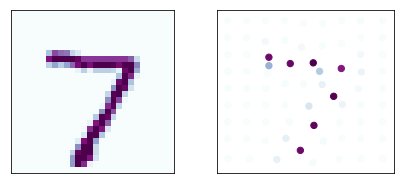

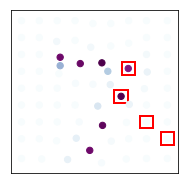

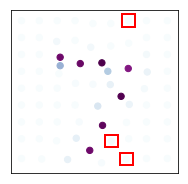

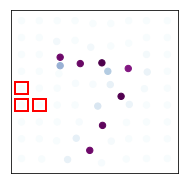

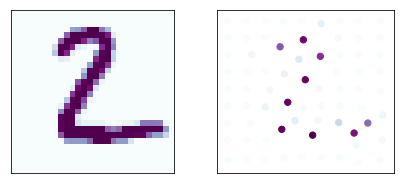

...

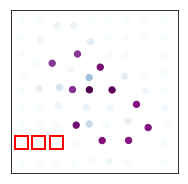

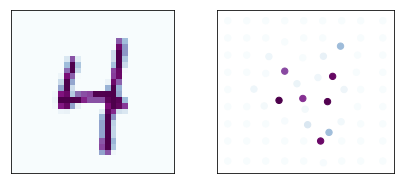

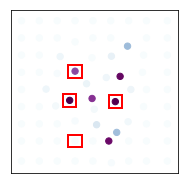

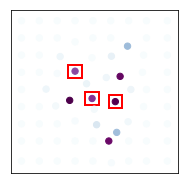

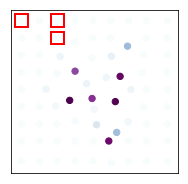

In [21]:
index_to_view = range(20)
Explanations = []
for iter, (graph, label, snorm_n, snorm_e) in enumerate(test_loader):
    if iter in index_to_view:
        img, _ = MNIST_test_dataset[iter]
        pgm = get_explanation(Ex_pgm, iter)
        shap = get_explanation(Ex_shap, iter)
        grad = get_explanation(Ex_grad, iter)
        
        f = plt.figure(figsize=(7, 3))
        plt1 = f.add_subplot(121)
        plt1.imshow(img[0],cmap = 'BuPu')
        plt1.axes.get_xaxis().set_ticks([])
        plt1.axes.get_yaxis().set_ticks([])

        plt2 = f.add_subplot(122)
        plot_superpixels_graph(plt2, graph)
        filename = 'visualize/original1/' + str(iter) + '.jpg' 
        f.savefig(filename, dpi=90, bbox_inches='tight')
        
        f = plt.figure(figsize=(3, 3))
        plt1 = f.add_subplot(111)
        plot_explanations_graph(plt1, graph, pgm)
        filename = 'visualize/pgm1/' + str(iter) + '.jpg' 
        f.savefig(filename, dpi=90, bbox_inches='tight')
        f = plt.figure(figsize=(3, 3))
        plt2 = f.add_subplot(111)
        plot_explanations_graph(plt2, graph, shap)
        filename = 'visualize/shap1/' + str(iter) + '.jpg' 
        f.savefig(filename, dpi=90, bbox_inches='tight')
        f = plt.figure(figsize=(3, 3))
        plt3 = f.add_subplot(111)
        plot_explanations_graph(plt3, graph, grad)
        filename = 'visualize/grad1/' + str(iter) + '.jpg' 
        f.savefig(filename, dpi=90, bbox_inches='tight')


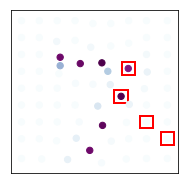

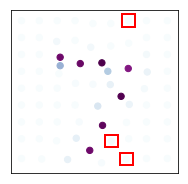

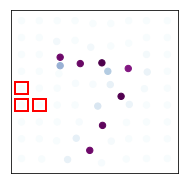

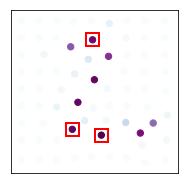

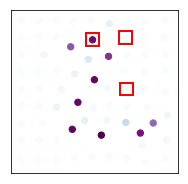

...

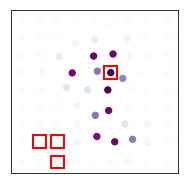

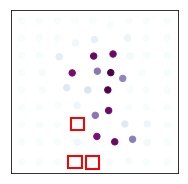

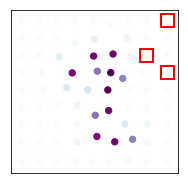

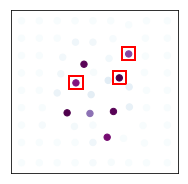

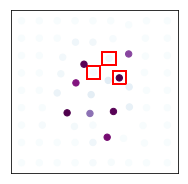

Error in callback <function flush_figures at 0x7f81938a4d90> (for post_execute):


KeyboardInterrupt: 

In [13]:
index_to_view = range(1000)
Explanations = []
for iter, (graph, label, snorm_n, snorm_e) in enumerate(test_loader):
    if iter in index_to_view:
        img, _ = MNIST_test_dataset[iter]
        pgm = get_explanation(Ex_pgm, iter)
        shap = get_explanation(Ex_shap, iter)
        grad = get_explanation(Ex_grad, iter)
        
#         f = plt.figure(figsize=(7, 3))
#         plt1 = f.add_subplot(121)
#         plt1.imshow(img[0],cmap = 'gray')
#         plt1.axis('off')
#         plt2 = f.add_subplot(122)
#         plot_superpixels_graph(plt2, graph)
#         filename = 'visualize/original/' + str(iter) + '.jpg' 
#         f.savefig(filename, dpi=90, bbox_inches='tight')
        
        f = plt.figure(figsize=(3, 3))
        plt1 = f.add_subplot(111)
        plot_explanations_graph(plt1, graph, pgm)
        filename = 'visualize/pgm/' + str(iter) + '.jpg' 
        f.savefig(filename, dpi=90, bbox_inches='tight')
        f = plt.figure(figsize=(3, 3))
        plt2 = f.add_subplot(111)
        plot_explanations_graph(plt2, graph, shap)
        filename = 'visualize/shap/' + str(iter) + '.jpg' 
        f.savefig(filename, dpi=90, bbox_inches='tight')
        f = plt.figure(figsize=(3, 3))
        plt3 = f.add_subplot(111)
        plot_explanations_graph(plt3, graph, grad)
        filename = 'visualize/grad/' + str(iter) + '.jpg' 
        f.savefig(filename, dpi=90, bbox_inches='tight')